In [236]:
# description       : Predict Airline customr satisfaction using naive bayes classificator
# author            : raulsainz
# email             : 
# date              : 20210326
# version           : 0.1
#==============================================================================

In [237]:
#Import necesary libraries
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.model_selection import ShuffleSplit
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import learning_curve
from sklearn.model_selection import StratifiedKFold

from sklearn import metrics
from sklearn.metrics import confusion_matrix
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import roc_auc_score
from sklearn.metrics import accuracy_score

#Import ML models t be used
from sklearn.naive_bayes import GaussianNB
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier,VotingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier

In [238]:
#Setup pandas display parameters
pd.options.display.max_columns = 50
pd.options.display.max_rows = 200
pd.options.display.max_colwidth= 50
pd.options.display.precision = 3

In [239]:
#Define initial model parameters
cv_n_split = 3
random_state = 42
test_train_split = 0.25
sample = True
sample_size = 0.4

# Dataset
## Data Set Information:
This dataset contains an airline passenger satisfaction survey. What factors are highly correlated to a satisfied (or dissatisfied) passenger? Can you predict passenger satisfaction?

<br>
Source: https://www.kaggle.com/teejmahal20/airline-passenger-satisfaction

## Attribute Information:

1.	Gender: Gender of the passengers (Female, Male)
2.	Customer Type: The customer type (Loyal customer, disloyal customer)
3.	Age: The actual age of the passengers
4.	Type of Travel: Purpose of the flight of the passengers (Personal Travel, Business Travel)
5.	Class: Travel class in the plane of the passengers (Business, Eco, Eco Plus)
6.	Flight distance: The flight distance of this journey
7.	Inflight wifi service: Satisfaction level of the inflight wifi service (0:Not Applicable;1-5)
8.	Departure/Arrival time convenient: Satisfaction level of Departure/Arrival time convenient
9.	Ease of Online booking: Satisfaction level of online booking
10.	Gate location: Satisfaction level of Gate location
11.	Food and drink: Satisfaction level of Food and drink
12.	Online boarding: Satisfaction level of online boarding
13.	Seat comfort: Satisfaction level of Seat comfort
14.	Inflight entertainment: Satisfaction level of inflight entertainment
15.	On-board service: Satisfaction level of On-board service
16.	Leg room service: Satisfaction level of Leg room service
17.	Baggage handling: Satisfaction level of baggage handling
18.	Check-in service: Satisfaction level of Check-in service
19.	Inflight service: Satisfaction level of inflight service
20.	Cleanliness: Satisfaction level of Cleanliness
21.	Departure Delay in Minutes: Minutes delayed when departure
22.	Arrival Delay in Minutes: Minutes delayed when Arrival
23.	**Satisfaction: Airline satisfaction level(Satisfaction, neutral or dissatisfaction)** ===Target Variable===

In [240]:
df_train = pd.read_csv('datasets/survey-train.csv')
df_test = pd.read_csv('datasets/survey-test.csv')

In [241]:
if sample:
    df_train = df_train.sample(frac = sample_size, replace=True, random_state=random_state)
    df_test = df_test.sample(frac = sample_size, replace=True, random_state=random_state)

In [242]:
#review column data types
df_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 41562 entries, 15795 to 59786
Data columns (total 25 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Unnamed: 0                         41562 non-null  int64  
 1   id                                 41562 non-null  int64  
 2   Gender                             41562 non-null  object 
 3   Customer Type                      41562 non-null  object 
 4   Age                                41562 non-null  int64  
 5   Type of Travel                     41562 non-null  object 
 6   Class                              41562 non-null  object 
 7   Flight Distance                    41562 non-null  int64  
 8   Inflight wifi service              41562 non-null  int64  
 9   Departure/Arrival time convenient  41562 non-null  int64  
 10  Ease of Online booking             41562 non-null  int64  
 11  Gate location                      41562 non-null 

In [243]:
columns_names = {
    'Customer Type': 'type_customer', 
    'Type of Travel': 'type_travel', 
    'Inflight wifi service': 'wifi', 
    'Flight Distance' : 'distance ', 
    'Departure/Arrival time convenient':'time_convenient', 
    'Ease of Online booking':'online_booking',
    'Gate location':'gate_location',
    'Food and drink':'food_drink',
    'Online boarding':'online_boarding',
    'Seat comfort ':'seat_comfort ',
    'Inflight entertainment':'entertainment',
    'On-board service':'On-board',
    'Leg room service':'leg_room',
    'Checkin service':'checkin',
    'Inflight service':'inflight',
    'Cleanliness':'cleanliness',
    'Departure Delay in Minutes':'dept_delay',
    'Arrival Delay in Minutes':'arr_delay'
    }
df_train.rename(columns = columns_names,inplace=True)
df_train.columns = map(str.lower, df_train.columns)
df_test.rename(columns = columns_names,inplace=True)
df_test.columns = map(str.lower, df_train.columns)
df_train.head()

,unnamed: 0,id,gender,type_customer,age,type_travel,class,distance,wifi,time_convenient,online_booking,gate_location,food_drink,online_boarding,seat comfort,entertainment,on-board,leg_room,baggage handling,checkin,inflight,cleanliness,dept_delay,arr_delay,satisfaction
15795,15795,52111,Female,Loyal Customer,14,Personal Travel,Eco,351,4,5,4,2,4,4,4,4,3,5,5,4,4,4,0,0.0,neutral or dissatisfied
860,860,38896,Female,Loyal Customer,37,Business travel,Eco,320,5,5,5,5,5,5,5,5,1,2,4,1,3,5,0,0.0,satisfied
103694,103694,36593,Male,Loyal Customer,46,Business travel,Eco,1197,1,2,2,2,1,1,1,4,3,3,3,1,1,1,260,263.0,neutral or dissatisfied
76820,76820,88599,Male,Loyal Customer,17,Personal Travel,Eco,646,3,4,3,1,3,3,2,3,5,1,2,4,4,3,0,2.0,neutral or dissatisfied
54886,54886,118014,Male,disloyal Customer,39,Business travel,Eco,637,3,5,3,5,3,3,3,3,4,3,2,3,2,3,1,0.0,neutral or dissatisfied


In [244]:
pd.DataFrame({
                'unicos':df_train.nunique(),
                'missing total': df_train.isna().sum(),
              'missing %': df_train.isna().sum()/df_train.count(),
              'tipo':df_train.dtypes})

,unicos,missing total,missing %,tipo
unnamed: 0,34206,0,0.000,int64
id,34206,0,0.000,int64
gender,2,0,0.000,object
type_customer,2,0,0.000,object
age,75,0,0.000,int64
type_travel,2,0,0.000,object
class,3,0,0.000,object
distance,3505,0,0.000,int64
wifi,6,0,0.000,int64
time_convenient,6,0,0.000,int64


There are 310 missing values in column "Arrival Delay" probably only delayed flights have this data.
 

In [245]:
df_train.columns

Index(['unnamed: 0', 'id', 'gender', 'type_customer', 'age', 'type_travel',
       'class', 'distance ', 'wifi', 'time_convenient', 'online_booking',
       'gate_location', 'food_drink', 'online_boarding', 'seat comfort',
       'entertainment', 'on-board', 'leg_room', 'baggage handling', 'checkin',
       'inflight', 'cleanliness', 'dept_delay', 'arr_delay', 'satisfaction'],
      dtype='object')

In [246]:
#Drop non usefull columns Unamed (old index) and survey id
df_train.drop(['id','unnamed: 0'],axis='columns', inplace=True)
df_test.drop(['id','unnamed: 0'],axis='columns', inplace=True)

In [247]:
#df = pd.get_dummies(df,columns=['Gender','Customer Type','Type of Travel','satisfaction','Class'])
df_train.dtypes

gender               object
type_customer        object
age                   int64
type_travel          object
class                object
distance              int64
wifi                  int64
time_convenient       int64
online_booking        int64
gate_location         int64
food_drink            int64
online_boarding       int64
seat comfort          int64
entertainment         int64
on-board              int64
leg_room              int64
baggage handling      int64
checkin               int64
inflight              int64
cleanliness           int64
dept_delay            int64
arr_delay           float64
satisfaction         object
dtype: object

In [248]:
# transform 'Object' variables into bool
df_train["male"] = np.where(df_train["gender"] == 'Male' , 1, 0)
df_train["loyal_customer"] = np.where(df_train["type_customer"] == 'Loyal Customer' , 1, 0)
df_train["business_travel"] = np.where(df_train["type_travel"] == 'Business travel' , 1, 0)
df_train["business_class"] = np.where(df_train["class"] == 'Business' , 1, 0)
df_train["satisfied"] = np.where(df_train["satisfaction"] == 'satisfied' , 1, 0)

# Drop transformed columns
df_train.drop(['gender','type_customer','type_travel','satisfaction','class'],axis='columns', inplace=True)



In [249]:
# transform 'Object' variables into bool
df_test["male"] = np.where(df_test["gender"] == 'Male' , 1, 0)
df_test["loyal_customer"] = np.where(df_test["type_customer"] == 'Loyal Customer' , 1, 0)
df_test["business_travel"] = np.where(df_test["type_travel"] == 'Business travel' , 1, 0)
df_test["business_class"] = np.where(df_test["class"] == 'Business' , 1, 0)
df_test["satisfied"] = np.where(df_test["satisfaction"] == 'satisfied' , 1, 0)
#Drop transformed columns
df_test.drop(['gender','type_customer','type_travel','satisfaction','class'],axis='columns', inplace=True)

In [250]:
df_train.describe()

,age,distance,wifi,time_convenient,online_booking,gate_location,food_drink,online_boarding,seat comfort,entertainment,on-board,leg_room,baggage handling,checkin,inflight,cleanliness,dept_delay,arr_delay,male,loyal_customer,business_travel,business_class,satisfied
count,41562.000,41562.000,41562.000,41562.000,41562.000,41562.000,41562.000,41562.000,41562.000,41562.00,41562.000,41562.000,41562.000,41562.00,41562.000,41562.000,41562.000,41432.000,41562.000,41562.000,41562.000,41562.000,41562.000
mean,39.406,1193.566,2.717,3.058,2.751,2.977,3.196,3.243,3.431,3.35,3.377,3.355,3.633,3.29,3.640,3.284,14.703,15.023,0.494,0.819,0.688,0.475,0.429
std,15.092,999.075,1.321,1.527,1.394,1.274,1.321,1.345,1.317,1.33,1.288,1.317,1.177,1.27,1.172,1.308,37.431,37.904,0.500,0.385,0.463,0.499,0.495
min,7.000,31.000,0.000,0.000,0.000,1.000,0.000,0.000,1.000,0.00,0.000,0.000,1.000,1.00,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
25%,27.000,414.000,2.000,2.000,2.000,2.000,2.000,2.000,2.000,2.00,2.000,2.000,3.000,2.00,3.000,2.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000
50%,40.000,849.000,3.000,3.000,3.000,3.000,3.000,3.000,4.000,4.00,4.000,4.000,4.000,3.00,4.000,3.000,0.000,0.000,0.000,1.000,1.000,0.000,0.000
75%,51.000,1744.000,4.000,4.000,4.000,4.000,4.000,4.000,5.000,4.00,4.000,4.000,5.000,4.00,5.000,4.000,12.000,13.000,1.000,1.000,1.000,1.000,1.000
max,85.000,4983.000,5.000,5.000,5.000,5.000,5.000,5.000,5.000,5.00,5.000,5.000,5.000,5.00,5.000,5.000,1305.000,1280.000,1.000,1.000,1.000,1.000,1.000


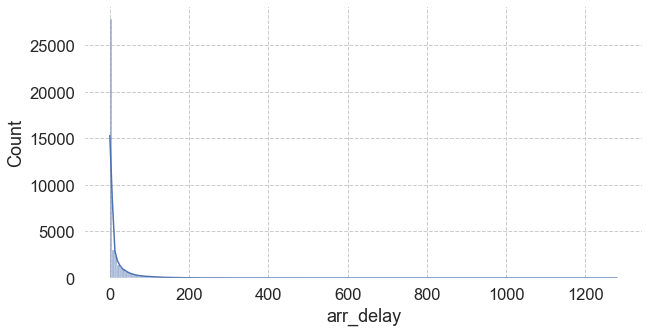

In [251]:

ax = sns.histplot(data = df_train , x ='arr_delay', kde=True,bins=200)

(0.0, 15.0)

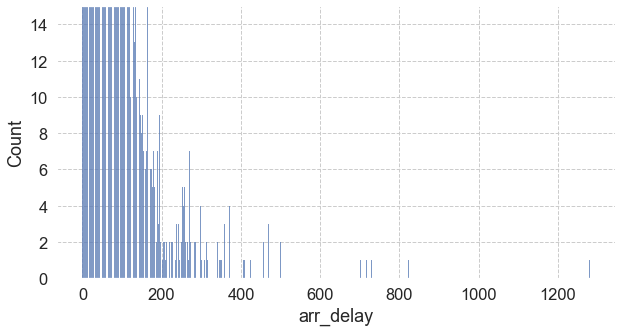

In [252]:
sns.histplot(data = df_train,x = 'arr_delay')
plt.ylim(0, 15)

<AxesSubplot:xlabel='arr_delay'>

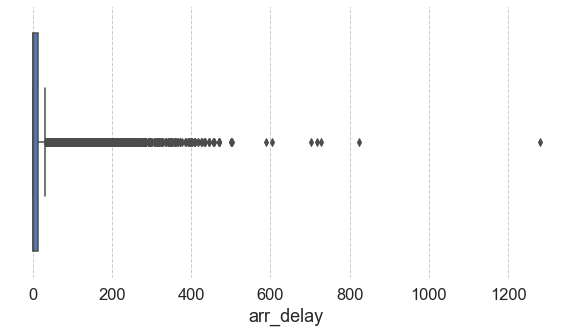

In [253]:
sns.boxplot(x=df_train["arr_delay"])

/Users/raulsainz/opt/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/raulsainz/opt/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/raulsainz/opt/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with

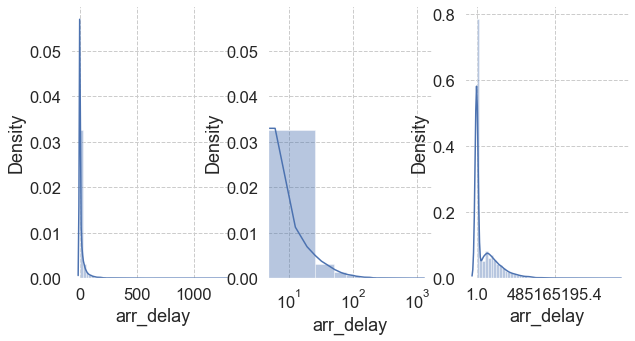

In [254]:
fig, ax = plt.subplots(1, 3, figsize=(10, 5))
data = df_train['arr_delay']
sns.distplot(df_train['arr_delay'], ax=ax[0])
sns.distplot(df_train['arr_delay'], ax=ax[1])
ax[1].set_xscale("log")
sns.distplot(np.sqrt(data), ax=ax[2])
ax[2].set_xticklabels([round(d, 1) for d in np.exp(ax[2].get_xticks())]);

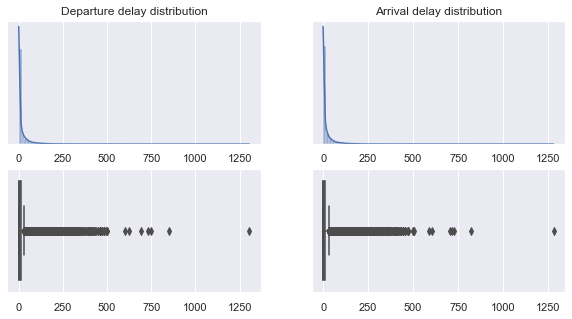

In [255]:

#plt.figure(figsize=(10,10))
sns.set_theme()
fig, axs = plt.subplots(ncols=2,nrows=2)
sns.histplot(x = 'dept_delay',  data = df_train, ax = axs[0,0], kde = True , bins = 80)
sns.histplot(x = 'arr_delay', data = df_train, ax = axs[0,1], kde = True , bins = 80)
sns.boxplot( x = 'dept_delay', data = df_train, ax = axs[1,0])
sns.boxplot( x = 'arr_delay', data = df_train, ax = axs[1,1])
axs[0,0].set(xlabel = "",title = 'Departure delay distribution')
axs[0,1].set(xlabel = "",title = 'Arrival delay distribution')
axs[0,0].axes.yaxis.set_visible(False)
axs[0,1].axes.yaxis.set_visible(False)
axs[1,0].set(xlabel = "")
axs[1,1].set(xlabel = "")

plt.show()

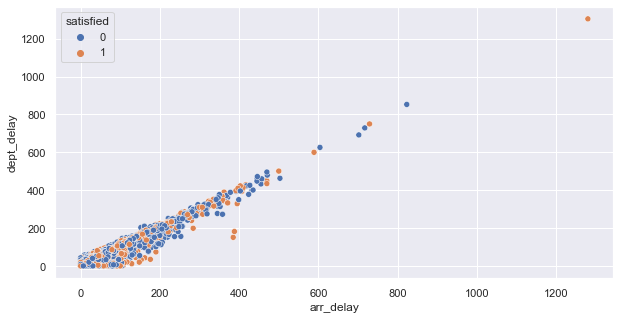

In [256]:
ax = sns.scatterplot(data=df_train, x="arr_delay", y="dept_delay", hue="satisfied")


In [257]:
query = df_train["dept_delay"].quantile(0.75)

df_train[df_train["dept_delay"]>query].shape

(10367, 23)

In [258]:
df_train["dept_delay"].quantile(0.99)

178.0

In [259]:
df_train[df_train["dept_delay"]>240].shape

(195, 23)

In [260]:
'''
maxValue = 60
#Replace extremely high values on columns by a maximum value
df['DelayDeptTime']= np.where((df["Departure Delay in Minutes"] >maxValue),maxValue,df["Departure Delay in Minutes"])
df['DelayArrTime']= np.where((df["Arrival Delay in Minutes"] >maxValue),maxValue,df["Arrival Delay in Minutes"])
df_test['DelayDeptTime']= np.where((df_test["Departure Delay in Minutes"] >maxValue),maxValue,df_test["Departure Delay in Minutes"])
df_test['DelayArrTime']= np.where((df_test["Arrival Delay in Minutes"] >maxValue),maxValue,df_test["Arrival Delay in Minutes"])
#Drop the old columns
#df.drop(['Departure Delay in Minutes','Arrival Delay in Minutes'],axis='columns', inplace=True)
df.head()
'''

'\nmaxValue = 60\n#Replace extremely high values on columns by a maximum value\ndf[\'DelayDeptTime\']= np.where((df["Departure Delay in Minutes"] >maxValue),maxValue,df["Departure Delay in Minutes"])\ndf[\'DelayArrTime\']= np.where((df["Arrival Delay in Minutes"] >maxValue),maxValue,df["Arrival Delay in Minutes"])\ndf_test[\'DelayDeptTime\']= np.where((df_test["Departure Delay in Minutes"] >maxValue),maxValue,df_test["Departure Delay in Minutes"])\ndf_test[\'DelayArrTime\']= np.where((df_test["Arrival Delay in Minutes"] >maxValue),maxValue,df_test["Arrival Delay in Minutes"])\n#Drop the old columns\n#df.drop([\'Departure Delay in Minutes\',\'Arrival Delay in Minutes\'],axis=\'columns\', inplace=True)\ndf.head()\n'

In [261]:
# NA Values on column: 
print('NA values before: ' + str(df_train['arr_delay'].isna().sum()))
#Replace NA values with 0, meaning no delay upon arrival
df_train['arr_delay'] = df_train['arr_delay'].fillna(0)
df_train['DelayArrBool'] = np.where(df_train["arr_delay"] > 15 , 1, 0)
df_train['DelayDeptBool'] = np.where(df_train["dept_delay"] > 15 , 1, 0)
#NA Values after fill with 0
print('NA values after: ' + str(df_train['arr_delay'].isna().sum()))

NA values before: 130
NA values after: 0


In [262]:
# NA Values on column: 
print('NA values before: ' + str(df_test['arr_delay'].isna().sum()))
#Replace NA values with 0, meaning no delay upon arrival
df_test['arr_delay'] = df_test['arr_delay'].fillna(0)
df_test['DelayArrBool'] = np.where(df_test["arr_delay"] > 15 , 1, 0)
df_test['DelayDeptBool'] = np.where(df_test["dept_delay"] > 15 , 1, 0)
#NA Values after fill with 0
print('NA values after: ' + str(df_test['arr_delay'].isna().sum()))

NA values before: 32
NA values after: 0


# Variable Analysis and plots

## Setup the seaborn settings for plotting

In [263]:

sns.set()
sns.set_context('notebook',rc={"grid.linewidth": 5})
sns.set_style("whitegrid")
colors = ["#345E6F","#264653","#287271","#2a9d8f","#e9c46a","#efb366","#f4a261","#ee8959","#e76f51","#e87153","#e97c61", '#902C14']
bin_colors = ["#264653","#2A9D8F","#ee8959","#e97c61"]
sns.set_palette(sns.color_palette(colors))
mul_palette = sns.color_palette(colors)
bin_palette = sns.color_palette(bin_colors)
sns.set(rc={'figure.figsize':(10,5)}, font_scale=1.5)
sns.set_style({'axes.facecolor':'white', 'grid.color': '.8','grid.linestyle': '--'})

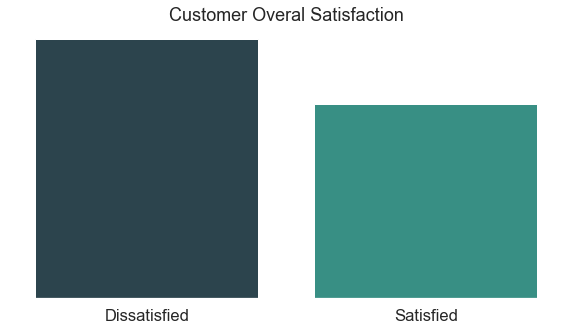

In [264]:
ax = sns.countplot(x = 'satisfied',  data = df_train,palette = bin_palette)
ax.set(xlabel="",title='Customer Overal Satisfaction')
ax.set_xticklabels(['Dissatisfied','Satisfied'])
ax.axes.yaxis.set_visible(False)

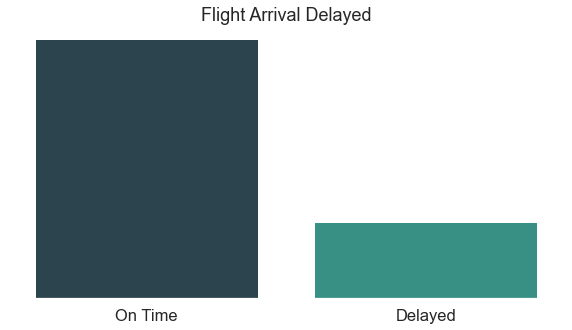

In [265]:

ax =sns.countplot(x = 'DelayArrBool',  data = df_train,palette = bin_palette)
ax.set(xlabel="",title='Flight Arrival Delayed')
ax.set_xticklabels(['On Time','Delayed'])
ax.axes.yaxis.set_visible(False)

In [266]:
pd.crosstab(df_train['satisfied'], df_train['loyal_customer'],margins=True)

loyal_customer,0,1,All
satisfied,,,
0,5830,17893,23723
1,1705,16134,17839
All,7535,34027,41562


In [267]:
df_train.dtypes

age                   int64
distance              int64
wifi                  int64
time_convenient       int64
online_booking        int64
gate_location         int64
food_drink            int64
online_boarding       int64
seat comfort          int64
entertainment         int64
on-board              int64
leg_room              int64
baggage handling      int64
checkin               int64
inflight              int64
cleanliness           int64
dept_delay            int64
arr_delay           float64
male                  int64
loyal_customer        int64
business_travel       int64
business_class        int64
satisfied             int64
DelayArrBool          int64
DelayDeptBool         int64
dtype: object

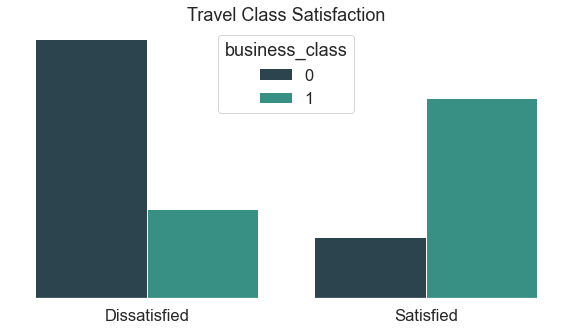

In [268]:
#create plot
ax = sns.countplot(x = 'satisfied', hue = 'business_class' , data = df_train,palette = bin_palette)
#Set Title
ax.set(xlabel = "",title = 'Travel Class Satisfaction')
#set labels friendly name
ax.set_xticklabels(['Dissatisfied','Satisfied'])
#Hide Y labels
ax.axes.yaxis.set_visible(False)

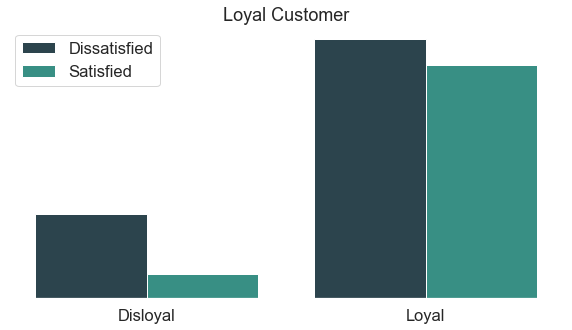

In [269]:
#create plot
ax = sns.countplot(x = 'loyal_customer' ,hue='satisfied', data = df_train,palette = bin_palette)

ax.set(xlabel = "",title = 'Loyal Customer')
#set legends friendly name
ax.legend(['Dissatisfied', 'Satisfied'])
ax.set_xticklabels(['Disloyal','Loyal'])
#Hide Y labels
ax.axes.yaxis.set_visible(False)


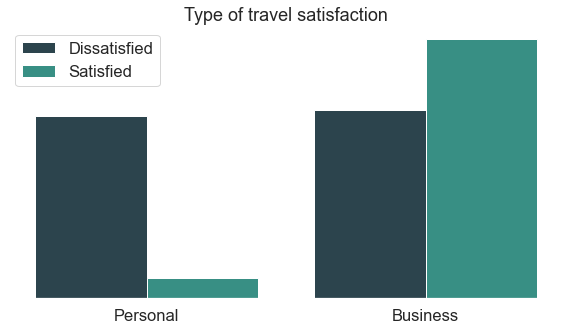

In [270]:
#create plot
ax = sns.countplot(hue = 'satisfied' ,x = 'business_travel', data = df_train, palette = bin_palette)

ax.set(xlabel = "",title = 'Type of travel satisfaction')
#set legends friendly name
ax.legend(['Dissatisfied', 'Satisfied'])
ax.set_xticklabels(['Personal','Business'])
#Hide Y labels
ax.axes.yaxis.set_visible(False)

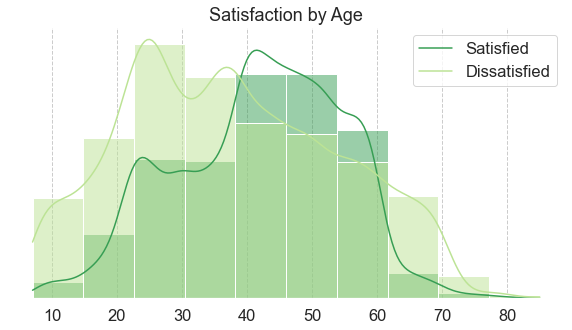

In [271]:
ax = sns.histplot(data=df_train, x="age", hue="satisfied",kde=True,bins=10,palette=('YlGn'))
ax.set(xlabel = "",title = 'Satisfaction by Age')
#set legends friendly name
ax.legend([ 'Satisfied','Dissatisfied']);
#Hide Y labels
ax.axes.yaxis.set_visible(False)

In [272]:
survey_columns = list(df_train.columns[2:16])

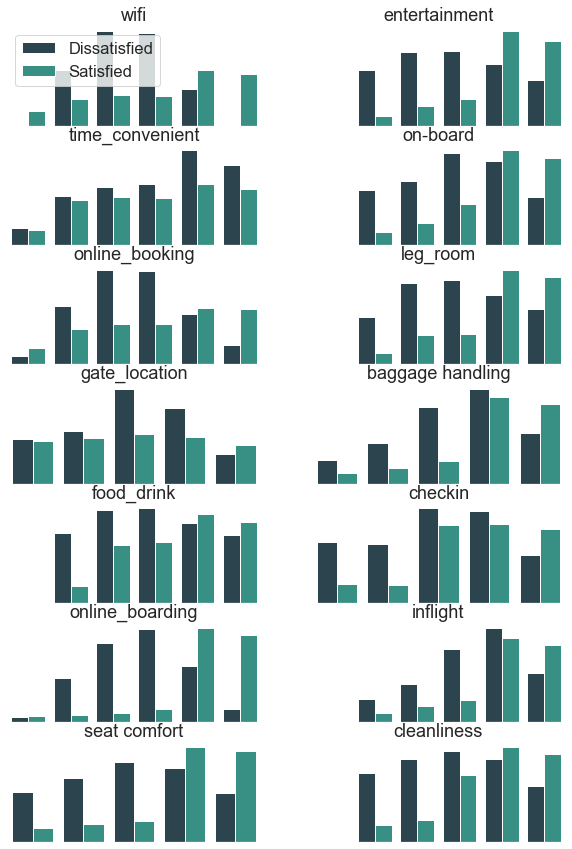

In [273]:
cols = 2
rows = 7
fig, axs = plt.subplots(ncols=cols,nrows=rows,figsize=(10,15))
for i in range (cols):
    for j in range(rows):
        sns.countplot(hue = 'satisfied' ,x=survey_columns[i*rows+j], data = df_train,palette = bin_palette,dodge=True , ax = axs[j,i])
        axs[j,i].set(xlabel = "",title = survey_columns[i*rows+j])
        axs[j,i].axes.yaxis.set_visible(False)
        axs[j,i].axes.xaxis.set_visible(False)
        if (i+j>0):
            axs[j,i].get_legend().remove()
        else:
            axs[j,i].legend(['Dissatisfied', 'Satisfied'])


In [274]:
survey_resuts = pd.DataFrame()
for col in survey_columns:
    survey_resuts[col] =df_train[col].value_counts(normalize = True).sort_values()
survey_resuts = survey_resuts.fillna(0).sort_index()
survey_resuts = survey_resuts.T
survey_resuts.sort_values(by= [0,1],ascending=True,inplace=True)
survey_resuts.head(15)

,0,1,2,3,4,5
baggage handling,0.000e+00,0.068,0.113,0.197,0.362,0.260
seat comfort,0.000e+00,0.115,0.147,0.181,0.305,0.252
checkin,0.000e+00,0.128,0.124,0.277,0.275,0.197
gate_location,0.000e+00,0.168,0.188,0.277,0.235,0.133
inflight,4.812e-05,0.067,0.112,0.195,0.367,0.260
on-board,4.812e-05,0.115,0.142,0.221,0.297,0.226
cleanliness,7.218e-05,0.127,0.157,0.236,0.266,0.215
entertainment,1.203e-04,0.120,0.171,0.185,0.285,0.238
food_drink,8.421e-04,0.122,0.213,0.218,0.237,0.209
leg_room,4.908e-03,0.099,0.186,0.195,0.276,0.239


In [275]:
survey_responses = {
    0:'Very Unsatisfied',
    1:'Unsatisfied',
    2:'Slighly Unsatisfied',
    3:'Slighly Satisfied',
    4:'Satisfied',
    5:'Very Satisfied'
}


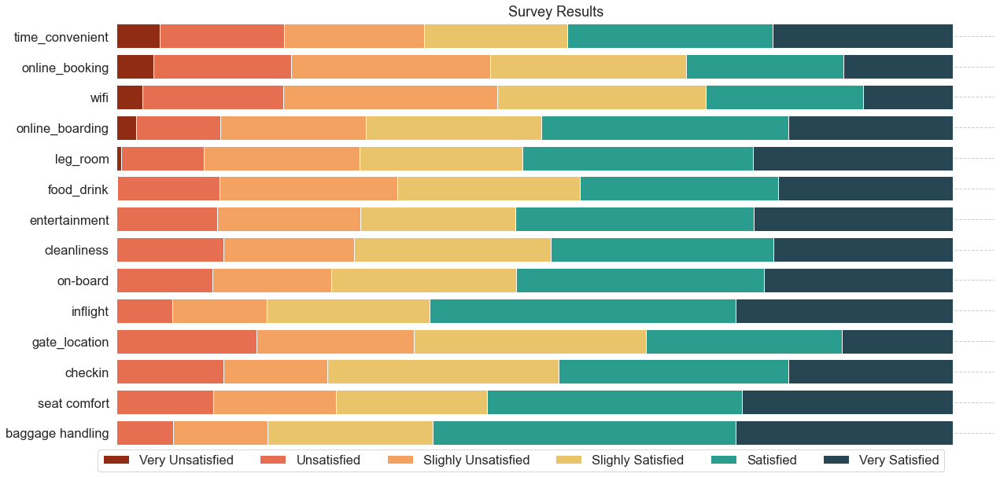

In [276]:
fields =  list(survey_responses.keys())
custom_colors = ['#902C14','#e76f51', '#f4a261', '#e9c46a', '#2a9d8f', '#264653'] 
labels = list(survey_responses.values())

fig, ax = plt.subplots(1, figsize=(20, 10))
# plot bars
left = len(survey_resuts) * [0]
for idx, name in enumerate(fields):
    rects = plt.barh(survey_resuts.index, survey_resuts[name], left = left, color=custom_colors[idx])
    left = left + survey_resuts[name]
    text_color = 'darkgrey'
    #ax.bar_label(rects, label_type='center', color=text_color)
# title, legend, labels
plt.title('Survey Results', loc='center')
#plt.legend(labels,ncol=len(labels), bbox_to_anchor = (0, 1), frameon=True,loc='lower left', fontsize='small')
#plt.legend(labels,ncol=len(labels), bbox_to_anchor = (0, 1), frameon=True,loc='lower left', fontsize='small')
plt.legend(labels,ncol=6, loc="lower right", frameon=True,bbox_to_anchor = (.95, -0.07))
#plt.legend(labels, bbox_to_anchor = (1, 1))
# remove spines
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['bottom'].set_visible(False)# adjust limits and draw grid lines
ax.axes.xaxis.set_visible(False)
plt.ylim(-0.5, ax.get_yticks()[-1] + 0.5)
ax.set_axisbelow(True)
plt.show()

<AxesSubplot:>

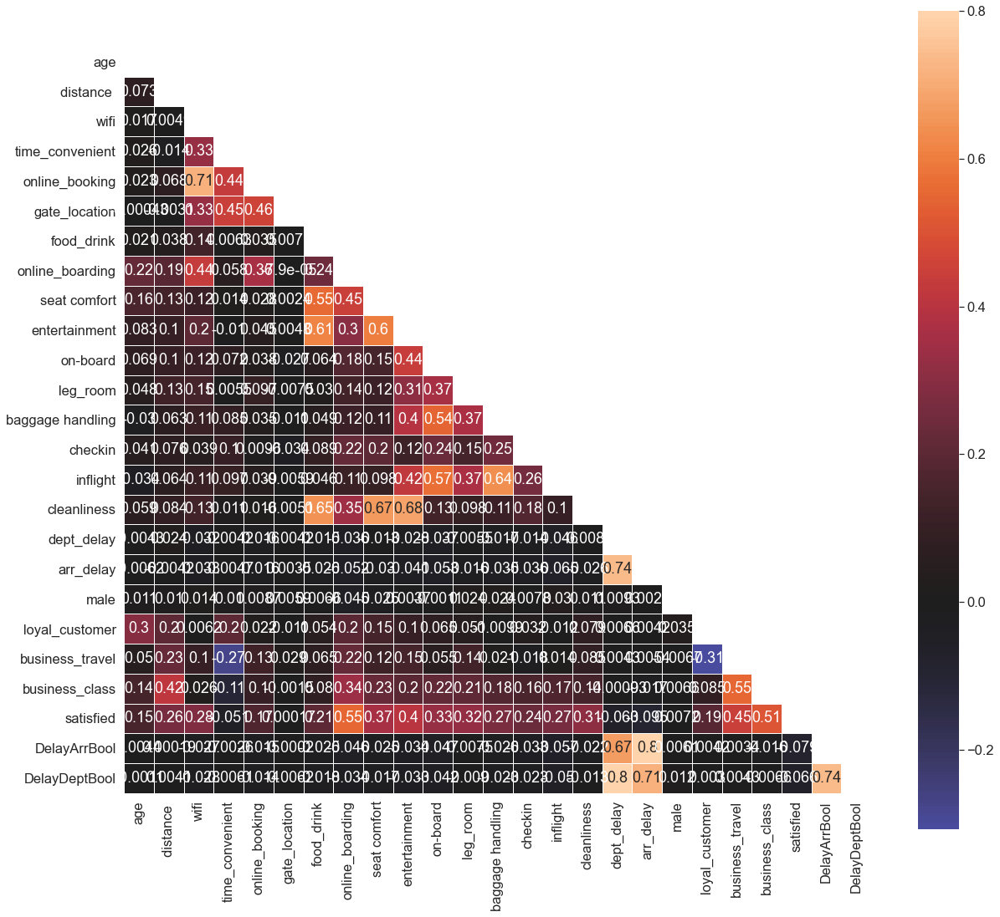

In [277]:
corr = df_train.corr(method='spearman')
# Generate a mask for the upper triangle
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(20, 18))
sns.color_palette("rocket")
# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, annot = True, mask=mask, center=0,
            square=True, linewidths=.5)

In [278]:
plt.figure(figsize=(16, 6))
# define the mask to set the values in the upper triangle to True
mask = np.triu(np.ones_like(df.corr(), dtype=np.bool))
heatmap = sns.heatmap(df.corr(), mask=mask, vmin=-1, vmax=1, cmap='BrBG')
heatmap.set_title('Triangle Correlation Heatmap', fontdict={'fontsize':18}, pad=16);

NameError: name 'df' is not defined

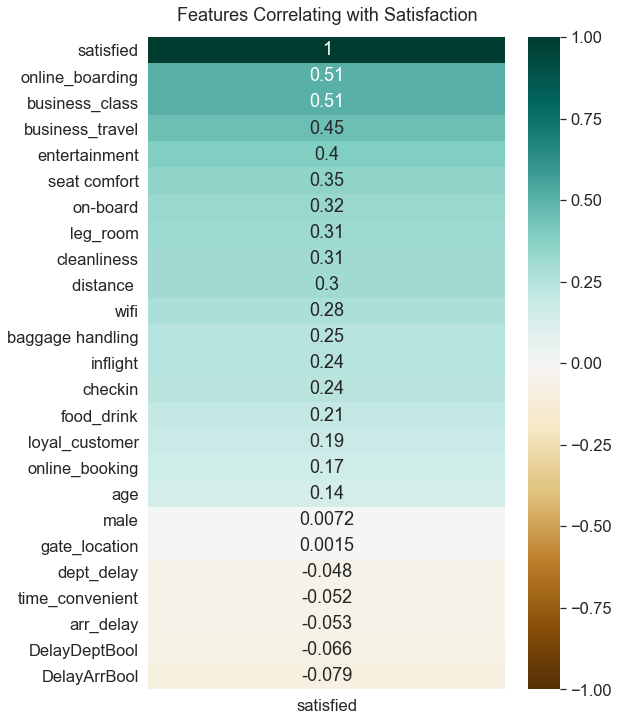

In [279]:
plt.figure(figsize=(8, 12))
heatmap = sns.heatmap(df_train.corr()[['satisfied']].sort_values(by='satisfied', ascending=False), vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Features Correlating with Satisfaction', fontdict={'fontsize':18}, pad=16);

In [280]:
col_drop = ['arr_delay','dept_delay','time_convenient','gate_location','male','DelayDeptBool','DelayArrBool']
df_train.drop(col_drop, axis='columns', inplace=True)
df_test.drop(col_drop, axis='columns', inplace=True)
print(df_train.shape)
print(df_test.shape)

(41562, 18)
(10390, 18)


In [281]:
print(df_train.columns)
print(df_test.columns)

Index(['age', 'distance ', 'wifi', 'online_booking', 'food_drink',
       'online_boarding', 'seat comfort', 'entertainment', 'on-board',
       'leg_room', 'baggage handling', 'checkin', 'inflight', 'cleanliness',
       'loyal_customer', 'business_travel', 'business_class', 'satisfied'],
      dtype='object')
Index(['age', 'distance ', 'wifi', 'online_booking', 'food_drink',
       'online_boarding', 'seat comfort', 'entertainment', 'on-board',
       'leg_room', 'baggage handling', 'checkin', 'inflight', 'cleanliness',
       'loyal_customer', 'business_travel', 'business_class', 'satisfied'],
      dtype='object')


In [282]:
y_train = df_train.pop('satisfied')
y_test = df_test.pop('satisfied')
X_train = df_train
X_test = df_test

In [283]:
print(y_train.shape)
print(y_test.shape)
print(X_train.shape)
print(X_test.shape)

(41562,)
(10390,)
(41562, 17)
(10390, 17)


In [284]:
'''
#Split the data into DV and IV's
X = df.drop('satisfied',axis=1)
print(X.shape)
y = df['satisfied']
print(y.shape)
#spliting the dataset
X_train,X_test, y_train,y_test = train_test_split(X,y,random_state=random_state)
'''

"\n#Split the data into DV and IV's\nX = df.drop('satisfied',axis=1)\nprint(X.shape)\ny = df['satisfied']\nprint(y.shape)\n#spliting the dataset\nX_train,X_test, y_train,y_test = train_test_split(X,y,random_state=random_state)\n"

In [285]:
#Create a Gaussian Classifier
naiveBayes1 = GaussianNB()
naiveBayes1.fit(X_train,y_train)

GaussianNB()

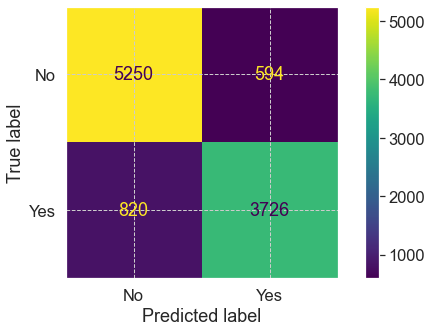

In [286]:
plot_confusion_matrix(naiveBayes1,X_test,y_test, display_labels=['No','Yes'])

In [287]:
 #Predict the response for test dataset
y_pred = naiveBayes1.predict(X_test)
# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.86390760346487


ROC_AUC = 0.8589894674651362
              precision    recall  f1-score   support

           0    0.86491   0.89836   0.88132      5844
           1    0.86250   0.81962   0.84051      4546

    accuracy                        0.86391     10390
   macro avg    0.86370   0.85899   0.86092     10390
weighted avg    0.86386   0.86391   0.86346     10390



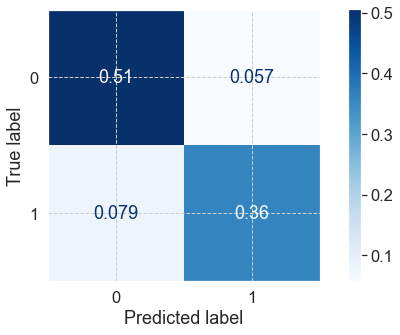

In [290]:
model_rf, roc_auc_rf = run_model(naiveBayes1, X_train, y_train, X_test, y_test)

In [34]:
scores = cross_val_score(naiveBayes1,X_train,y_train,cv=10) #Evaluate a score by cross-validation

In [35]:
print(scores)

[0.86478683 0.86854008 0.86565297 0.86882879 0.86352262 0.86612127
 0.86458133 0.86920115 0.87189605 0.87430221]


In [292]:
clf = DecisionTreeClassifier(random_state=0)
path = clf.cost_complexity_pruning_path(X_train, y_train)
ccp_alphas, impurities = path.ccp_alphas, path.impurities
impurities

array([0.00000000e+00, 4.68870109e-05, 9.39840421e-05, 1.41503411e-04,
       1.89311817e-04, 2.37133809e-04, 2.85133478e-04, 3.33139510e-04,
       3.81180720e-04, 4.29513281e-04, 4.71619051e-04, 6.15405008e-04,
       6.59515814e-04, 7.04629139e-04, 7.49742464e-04, 7.95032703e-04,
       8.40322943e-04, 9.31217938e-04, 9.77151505e-04, 1.02406936e-03,
       1.07104451e-03, 1.11818333e-03, 1.16543774e-03, 1.21281830e-03,
       1.26021007e-03, 1.30782442e-03, 1.35552723e-03, 1.40323328e-03,
       1.45113739e-03, 1.48321798e-03, 1.53274846e-03, 1.58260669e-03,
       1.77387994e-03, 1.80997060e-03, 1.90364591e-03, 1.99815359e-03,
       2.03665029e-03, 2.07675103e-03, 2.11685176e-03, 2.15695249e-03,
       2.19705322e-03, 2.23715396e-03, 2.51911224e-03, 2.56035870e-03,
       2.60160517e-03, 2.64285164e-03, 2.68409811e-03, 2.72534458e-03,
       2.76659105e-03, 2.80869682e-03, 2.85080259e-03, 2.89290836e-03,
       2.97711989e-03, 3.01922566e-03, 3.10414486e-03, 3.14691898e-03,
      

In [293]:

folds = 5

classifier = [ DecisionTreeClassifier(random_state = random_state), RandomForestClassifier(random_state = random_state),KNeighborsClassifier() ]


dt_param = {"min_samples_split" : np.linspace(0.1, 1.0, 10, endpoint=True),
              "min_samples_leaf": np.linspace(0.1, 0.5, 5, endpoint=True),
              "max_depth"       : np.linspace(1, 32, 32, endpoint=True),
              #'ccp_alpha'       : ccp_alphas,
              #'impurities'      : impurities,
              'max_features'    : list(range(1,X_train.shape[1]))
              }

rf_param = {"max_features":[1,3,10],
              "min_samples_split":[2,3,10],
              "min_samples_leaf":[1,3,10],
              "bootstrap":[False],
              "n_estimators":[100,300],
              "criterion":["gini"]
              }
knn_param = {"n_neighbors": list(range(1, 20)),
               "weights":["distance","uniform"]
            }
classifier_params = [ dt_param, rf_param, knn_param ]

In [294]:
cv_result=[]
best_estimators=[]
for i in range(len(classifier)):
    clf=GridSearchCV(classifier[i],param_grid=classifier_params[i],cv=StratifiedKFold(n_splits=cv_n_split),scoring="accuracy",n_jobs=-1,verbose=1)
    clf.fit(X_train,y_train)
    cv_result.append(clf.best_score_)
    best_estimators.append(clf.best_estimator_)
    print(cv_result[i])

Fitting 3 folds for each of 25600 candidates, totalling 76800 fits
0.8470718444733171
Fitting 3 folds for each of 54 candidates, totalling 162 fits
0.9704297194552716
Fitting 3 folds for each of 38 candidates, totalling 114 fits
0.8202203936287956


In [295]:
cv_result

[0.8470718444733171, 0.9704297194552716, 0.8202203936287956]

In [307]:
best_estimators[1]


RandomForestClassifier(bootstrap=False, max_features=10, min_samples_split=3,
                       random_state=42)

ROC_AUC = 0.9580809508882205
              precision    recall  f1-score   support

           0    0.95538   0.97467   0.96493      5844
           1    0.96658   0.94149   0.95387      4546

    accuracy                        0.96015     10390
   macro avg    0.96098   0.95808   0.95940     10390
weighted avg    0.96028   0.96015   0.96009     10390



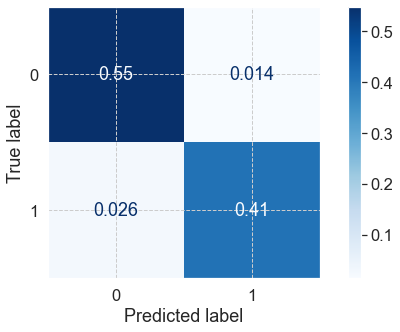

In [308]:
final_model = RandomForestClassifier(random_state = random_state, bootstrap=False, max_features=10, min_samples_split=3)
model_rf, roc_auc_rf = run_model(final_model, X_train, y_train, X_test, y_test)

In [289]:
def run_model(model, X_train, y_train, X_test, y_test, verbose=True):
    if verbose == False:
        model.fit(X_train,y_train, verbose=0)
    else:
        model.fit(X_train,y_train)
    y_pred = model.predict(X_test)
    roc_auc = roc_auc_score(y_test, y_pred)
    print("ROC_AUC = {}".format(roc_auc))
    print(classification_report(y_test,y_pred,digits=5))
    plot_confusion_matrix(model, X_test, y_test,cmap=plt.cm.Blues, normalize = 'all')
    
    return model, roc_auc

In [ ]:
#Crate a list witl all the categorical variables
categorical_columns = list(df_train.columns[6:20])
categorical_columns.extend(list(df_train.columns[23:28]))
categorical_columns.extend(['type_customer','type_travel','class Type','Type of Travel','satisfaction'])
categorical_columns
#Fix data types for categorical columns
for col in categorical_columns:
    df[col] = df[col].astype('category')
    df_test[col] = df_test[col].astype('category')
df.dtypes